# Text Generation Case Study

The objective is to generate text using word based seq2seq models. We will use three models for this task and compare their performance. 
1. LSTM
2. Attention based Encoder-Decoder
3. Pretrained GPT-2 small 

Refrence papers: 
1. Neural Text Generation: Past, Present and Beyond (https://arxiv.org/abs/1803.07133)
2. Gmail Smart Compose: Real-Time Assisted Writing (https://arxiv.org/pdf/1906.00080.pdf)


Refrence blogs:
1. http://karpathy.github.io/2015/05/21/rnn-effectiveness/
2. https://www.tensorflow.org/tutorials/text/text_generation
3. https://www.tensorflow.org/tutorials/text/nmt_with_attention
4. https://openai.com/blog/better-language-models/
5. http://jalammar.github.io/illustrated-transformer/
6. http://jalammar.github.io/illustrated-gpt2/
7. https://minimaxir.com/2019/09/howto-gpt2/
8. https://medium.com/@ngwaifoong92/beginners-guide-to-retrain-gpt-2-117m-to-generate-custom-text-content-8bb5363d8b7f
9. https://udai.gitbook.io/practical-ml/nn/training-and-debugging-of-nn
10. https://udai.gitbook.io/practical-ml/nn/training-and-debugging-of-nn

Dataset:

- Total 3700 articles are scrapped from https://www.universetoday.com/ to train the above models. 

<h3>Sample Article:</h3>

https://www.universetoday.com/145983/review-galileo-and-the-science-deniers-by-mario-livio/

Review: Galileo and the Science Deniers by Mario Livio

So, you think you know Galileo? A new book out from Simon and Schuster publishing looks at the exploits of one of the most famous astronomers there ever was: Galileo Galilei. Galileo and the Science Deniers by Dr. Mario Livio not only looks at the life and times of the famous astronomer, but busts some of the most famous myths surrounding Galileo, and looks at his greatest discoveries and tempestuous clash with the Roman Catholic Church and its aftermath. Livio also connects the science denialism of the day with comparisons to modern clashes between politics and science. 

Galileo’s life bridged the gulf between astronomy’s hoary roots in the arcane pseudoscience of astrology and modern astronomy. Galileo urged for experimentation as a method to understand reality and the Universe, rather than the notion of strictly contemplating nature as espoused by Greek thinkers such as Plato and Aristotle that had held sway for millennia.
Galileo and the Science Deniers follows Galileo the experimenter and consummate scientist right up through 17th century super-stardom. The book also takes a hard look at some of the anecdotes that surround Galileo, stories that are often incorporated into sound-bites even today: he probably didn’t drop objects from Pisa’s famous Leaning Tower to study acceleration, or mutter “E pur si muove” (“and yet, it moves”), upon receiving his sentence for supporting Copernicus’ heliocentric theory from the Papal Court.

 
(adsbygoogle = window.adsbygoogle || []).push({}); 


Galileo didn’t even invent the telescope, and wasn’t the very first person to turn it skyward; instead, he was the first observational astronomer to peer through the eyepiece and attempt to methodically interpret and document what he saw. Galileo was the first ‘publish or perish’ astronomer. He faithfully chronicled what he saw in the sky, often carefully coding and transmitting his finds in Latin to his contemporary Johannes Kepler.
The first star party? Galileo shows off his telescope to Leonardo Donato. Credit: Wkimedia Commons/public Domain.
The finds came at an almost nightly pace during the zenith of Galileo’s observing career around 1610: peering through his primitive eyepiece, he saw that Venus went through crescent phases, like the Moon. The Moon’s surface, it turned out, was not smooth and perfect like Aristotle had once held it to be, but mottled with flat maria, craters and mountains. Jupiter hosted its own mini-solar system which he termed ‘Medici stars,’ after his Florentine benefactors, moons that are now instead termed the Galilean moons in the astronomer’s honor. Saturn seemed to have two tiny ‘handles,’ appendages which must have confounded Galileo. And the plane of the Milky Way was flush with faint stars, invisible to the naked eye.
This new view of the Universe also convinced Galileo of the reality of the Copernican view, that the Sun and not the Earth was the center of the Solar System and the Universe. It also caused Galileo to famously run afoul with the Roman Catholic Church, which was still reeling from the Protestant Reformation.

 
(adsbygoogle = window.adsbygoogle || []).push({}); 


Galileo and the Science Deniers covers the trial and its aftermath. This event still has implications for faith in context with science that echo even today: the Church only reexamined the trial of Galileo in the mid-20th century, and reassessed its view in 1992.
Read Galileo and the Science Deniers to look at the life and a pivotal moment in modern science and astronomy.
Share this:Click to share on Facebook (Opens in new window)Click to share on Pocket (Opens in new window)Click to share on Twitter (Opens in new window)Click to share on LinkedIn (Opens in new window)Click to share on Tumblr (Opens in new window)Click to share on Pinterest (Opens in new window)Click to share on Reddit (Opens in new window)Click to print (Opens in new window)MoreClick to email this to a friend (Opens in new window)Like this:Like Loading... 

In [2]:
# importing basic libraries
%matplotlib inline 
import warnings
warnings.filterwarnings("ignore")
import spacy
import pandas as pd
import os
import numpy as np
import re
from tqdm import tqdm
from collections import Counter
import matplotlib.pyplot as plt
import datetime
import pickle
import random
import time
import seaborn as sns
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
np.random.seed(42)

In [ ]:
# import libraries for Deep Learning
import tensorflow as tf
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.layers import Dense, Dropout, LSTM, Embedding, Activation, concatenate
from tensorflow.keras.losses import sparse_categorical_crossentropy 
from tensorflow.keras import Model, Input
tf.random.set_seed(32)

In [0]:
# import libraries for GPT-2
#%tensorflow_version 1.x
!pip install -q gpt-2-simple
import gpt_2_simple as gpt2
from datetime import datetime
from google.colab import files

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


## 1. Data Cleaning

- The below function will remove some adds, Share, Subscribe, Credit, Image and video captions, websites url and links as they are not necessary for our sequence model.
- We will remove punctuations except (.,?!).
- We will replace numbers with numtag and alphanumeric words with alphanumerictag.

In [0]:
def cleaning_files(file):
  '''Function to clean and replace some words with tags.'''
    data = []
    with open(DIR_PATH + file) as fp: 
        ID = file.split('.')[0] 
        for line in fp: 
            line = line.strip() 
            replaced = " ".join(line.split()) 
            # replace some tags with ''
            replaced = re.sub('(\(adsbygoogle.*).push\({}\);','',replaced) 
            replaced = re.sub('Further Reading:.*', '', replaced) 
            replaced = re.sub('Share this:Click.*', '', replaced) 
            replaced = re.sub('Podcast \(.*\)', '', replaced) 
            replaced = re.sub('Subscribe:.*', '', replaced) 
            replaced = re.sub('Video caption:.*', '', replaced) 
            replaced = re.sub('Image Credit:.*', '', replaced) 
            replaced = re.sub('Credit:.*', '', replaced) 
            replaced = re.sub('((http|https)\:\/\/)?[a-zA-Z0-9\.\/\?\:@\-_=#]+\.([a-zA-Z]){2,6}([a-zA-Z0-9\.\&\/\?\:@\-_=#])*','', replaced) # replace website-urls with empty ''
            replaced = re.sub(r"n\'t", " not", replaced)
            replaced = re.sub(r"\'re", " are", replaced)
            replaced = re.sub(r"\'s", " is", replaced)
            replaced = re.sub(r"\'d", " would", replaced)
            replaced = re.sub(r"\'ll", " will", replaced)
            replaced = re.sub(r"\'t", " not", replaced)
            replaced = re.sub(r"\'ve", " have", replaced)
            replaced = re.sub(r"\'m", " am", replaced)
            replaced = re.sub('[0-9]+[,\.][0-9]+','numtag', replaced)
            replaced = re.sub(r' +',' ', replaced)
            replaced = re.sub("([?.!,'])", r" \1 ", replaced)
            replaced = re.sub(r"[^a-zA-Z0-9?.!,]+", " ", replaced)
            data.append(replaced.lower()) 
    title = data.pop(0) 
    content = ' '.join(data) 
    return ID, title, content    

In [0]:
def remove_space(data):
  ''' Function to remove extra space after cleaning'''
    lst = []
    for e in data:
        w = re.sub(r' +',' ', e)
        lst.append(w)
    return lst

def replacing_with_tags(data_list):
  '''Function to convert number and alphanumeric words into their tags'''
    numtag_list = []
    for line in tqdm(data_list):
        lst = []
        for word in line.split(' '):
            if word.isdigit(): 
                lst.append('numtag')
            else:
                rep = re.sub('([a-z]+)?[0-9]+([a-z]+)?', 'alphanumeric', word)
                lst.append(rep)
        numtag_list.append(lst)
    return numtag_list

def convert_into_list(data):
  '''Function to convert data into list'''
    lst = []
    for e in tqdm(data):
        f = ' '.join(e)
        lst.append(f)
    return lst

def remove_final_spaces(data):
    '''Function to remove final spaces from the data'''
    lst = []
    for e in data:
        lst.append(e.strip())
    return lst

In [0]:
def preprocess_data(DIR_PATH):
  '''Function to read articles from text files. After cleaning it will convert into dataframe'''
    start = time.time()
    if not DIR_PATH:
        print('No directory exists one this path, please find correct the path.')
        return 
    
    file_list = os.listdir(DIR_PATH)
    print('Total files in the given directory : ', len(file_list))
    print('Cleaning text..')
    
    ID_list = [] 
    title_list = [] 
    content_list = [] 
    for file in tqdm(file_list):
        ID, title, content = cleaning_files(file) 
        ID_list.append(ID)
        title_list.append(title)
        content_list.append(content)
 

    titles = remove_space(title_list)
    contents = remove_space(content_list)
    
    numtag_title_list = replacing_with_tags(titles)
    numtag_content_list = replacing_with_tags(contents)
    
    numtag_title_list_new = convert_into_list(numtag_title_list)
    numtag_content_list_new = convert_into_list(numtag_content_list)
    
    titles = remove_final_spaces(numtag_title_list_new)
    contents = remove_final_spaces(numtag_content_list_new)
    
    df = pd.DataFrame({'ID':ID_list, 'Title':titles, 'Content':contents}, columns = ['ID', 'Title', 'Content'])
    df['total_words_in_content'] = df['Content'].apply(lambda x:len(x.strip().split(' ')))
    df.to_csv("/content/drive/My Drive/Project-1(AAIC)/result_3.7k_final.csv", header = ['ID', 'Title', 'Content', 'word_count'], index=False)
    print('Done..')
    print('Time taken is : ', time.time()-start)
    
    return df

In [0]:
DIR_PATH = '/content/drive/My Drive/Project-1(AAIC)/scrapped_files(3.7k)/'

df = preprocess_data(DIR_PATH)
df.head()

  0%|          | 0/3370 [00:00<?, ?it/s]

Total files in the given directory :  3370
Cleaning text..


100%|██████████| 3370/3370 [00:00<00:00, 38074.57it/s]


Done..
Time taken is :  1966.1806752681732


,ID,Title,Content,total_words_in_content
0,article754,"perfect example of a barred spiral galaxy , se...",the hubble space telescope has given us a beau...,1447
1,article331,numtag supernovae exploded near the core of th...,thanks to the latest generation of sophisticat...,909
2,article481,some quasars shine with the light of over a tr...,quasars are some of the brightest objects in t...,1174
3,article1215,an extremely large hole has been dug for the e...,"all over the world , some truly groundbreaking...",979
4,article589,how do we colonize the moon ?,welcome back to our series on colonizing the s...,3936


## 2. EDA

Below function will plot PDF and CDF of word counts of articles.

In [3]:
df = pd.read_csv('result_3.7k_final.csv')
df.head(3)

,ID,Title,Content,word_count
0,article1994,"weekly space hangout sept numtag , numtag dr ....",hosts fraser cain fcain dr . paul m . sutter p...,248
1,article1909,"weekly space hangout oct numtag , numtag weekl...",hosts fraser cain fcain dr . paul m . sutter p...,93
2,article406,"weekly space hangout november numtag , numtag ...",hosts fraser cain fcain dr . morgan rehnberg m...,452


In [5]:
def analyze_word_count(data, CDF=True):
#'''Function to plot PDF and CDF for wordcount'''
    sns.set()
    x = data.values
    if CDF:
        kwargs = {'cumulative': True}
        ax = sns.distplot(x,  kde_kws=kwargs)
        ax.set_title('CDF for word_count')
        ax.set_xlabel('Number of words')
    else:
        ax = sns.distplot(x)    
        ax.set_title('PDF for word_count')
        ax.set_xlabel('Number of words')

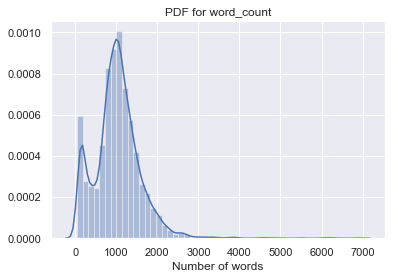

In [7]:
analyze_word_count(df['word_count'], CDF=False)

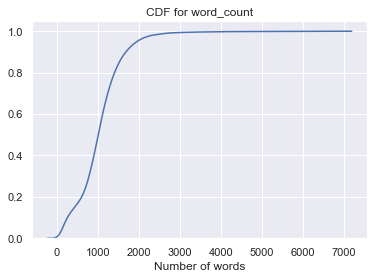

In [8]:
analyze_word_count(df['word_count'], CDF=True)

- From the above plots, we can say that most of the articles having wordcount from 500 to 1500.
- Alomst 95% of the articles having word count less than 2000.

### Train and Validation dataset

In [12]:
sort_len = sorted(df['word_count'].values, reverse=True)
d = df[df['word_count'] >= 1760]
d.sort_values('word_count', ascending=False, inplace=True)
train_df = d[:128]
val_df = d[128:192]

def count_words(data):
  '''Function to get all words from all articles'''
  words = []
  for line in data:
    for word in line.split(' '):
      words.append(word)
  return words

# Get all words form train and val articles.
train_words = count_words(train_df['Content'].values)
val_words = count_words(val_df['Content'].values)

# get unique words
unique_sorted_words = sorted(list(set(train_words)))
vocab_size = (len(unique_sorted_words))

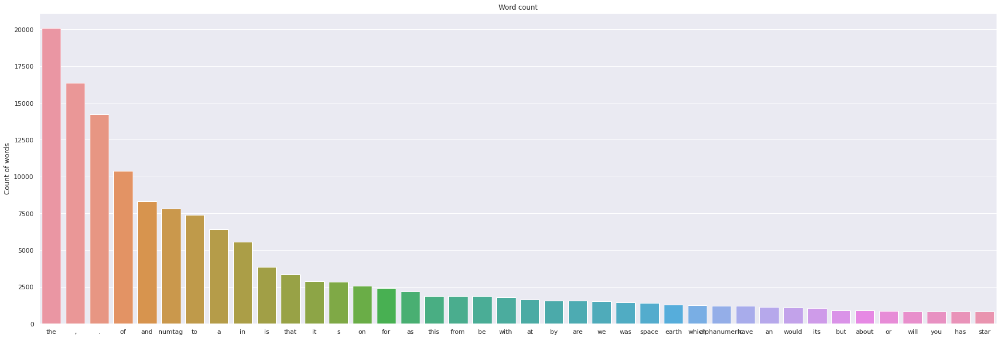

In [0]:
# create counter of each word and its count

word_counter = Counter(train_words) 
sorted_word_counter = sorted(word_counter.items(), key=lambda kv: kv[1], reverse=True)
result = list(zip(*sorted_word_counter)) 
words = list(result[0]) # words in sorted order according to their counts
count = list(result[1])
x = np.arange(40)
plt.figure(figsize=(30,10))
p1 = sns.barplot(x, count[:40]).set_title('Word count')
plt.ylabel('Count of words')
plt.xticks(x, words[:40])
plt.show()

- From the above plot we can say that, 'the', ',', '.', 'of', 'and', 'numtag' are the words which are mostly found in all the articles.

In [0]:
def plot_word_cloud(df, data='Content', article_num=125):
    '''Create and generate a word cloud image'''
    wordcloud = WordCloud().generate(df[data].iloc[article_num])
    # Display the generated image:
    plt.figure(figsize=(30,10))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title('Word cloud')
    plt.axis("off")
    plt.show()

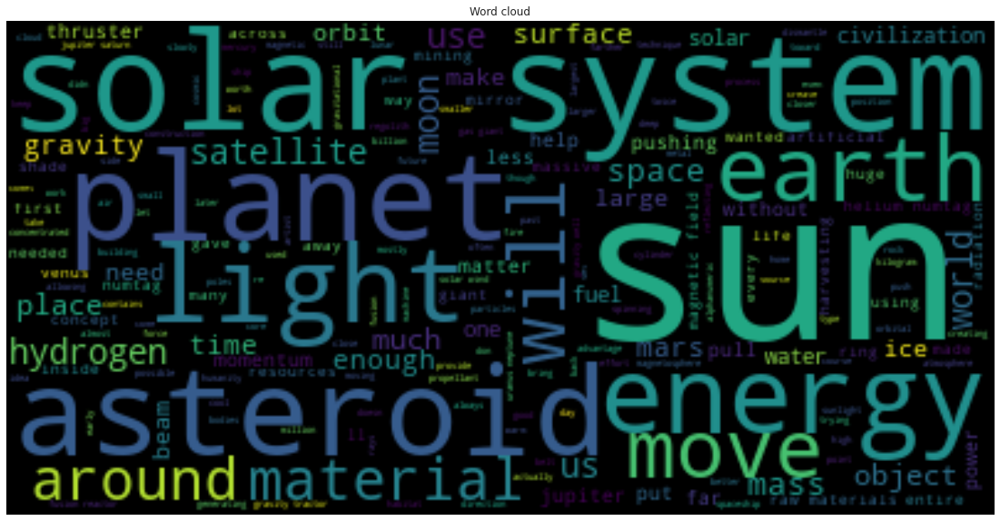

In [0]:
plot_word_cloud(train_df, data='Content', article_num=5)

- The above wordclousd shows that solar, sun, system, asteroid are the words which are occuring more in the given article.

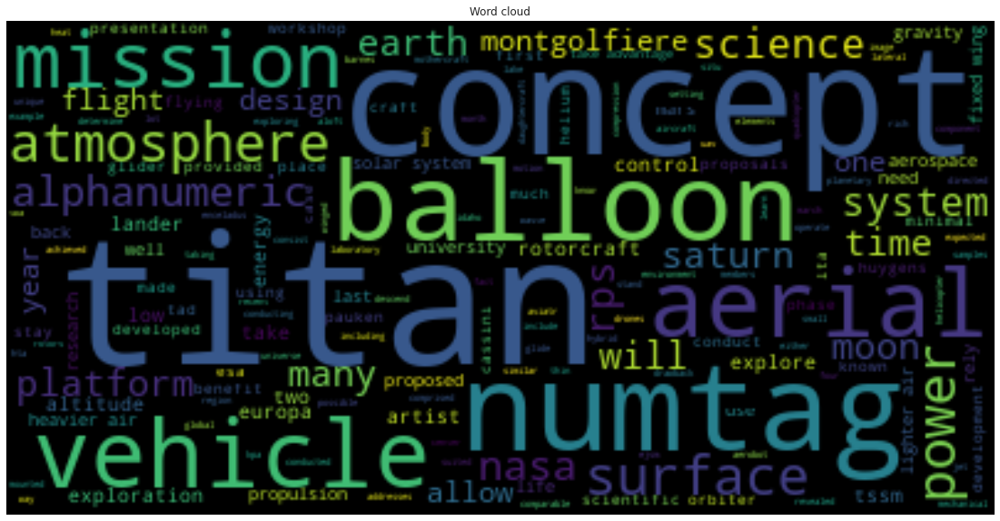

In [0]:
plot_word_cloud(val_df, data='Content', article_num=5)

- The above article has words like titan, concept, vehicle, numtag, etc.

<h3>Word count and character count analysis</h3>

In [0]:
def find_total_number_of_words(df):
    '''Function to calculate total number of words in df'''
    df['word_count'] = df['Title'].apply(lambda x:len(x.strip().split(' ')))
    df['word_count'] = df['Content'].apply(lambda x:len(x.strip().split(' ')))
    return df

def find_total_number_of_characters(df):
    '''Function to calculate total number of characters in df'''
    df['total_characters_in_title'] = df['Title'].apply(lambda x:len(x.strip()))
    df['total_characters_in_content'] = df['Content'].apply(lambda x:len(x.strip()))
    return df
  
train_df = find_total_number_of_words(train_df)
val_df = find_total_number_of_words(val_df)

train_df = find_total_number_of_characters(train_df)
val_df = find_total_number_of_characters(val_df)

<h4>Histograms of characters</h4>

In [9]:
def plot_histogram_chars(df, data='train'):
    '''Function to plot histograms for characters'''
    fig, axs = plt.subplots(ncols=2, figsize=(15,5))
    sns.distplot(df['total_characters_in_content'], hist=True, kde=True, ax=axs[1])\
    .set_title('Character count in content of {} data'.format(data))
    sns.distplot(df['total_characters_in_title'], hist=True, kde=True, ax=axs[0])\
    .set_title('Character count in title of {} data'.format(data))
    savefig('sample.pdf')

<h4>Train data</h4>

KeyError: 'total_characters_in_content'

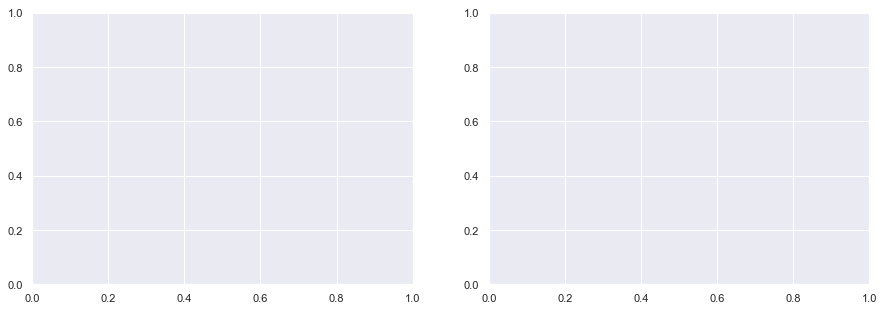

In [13]:
plot_histogram_chars(train_df, 'train')

- Most of the articles in train data are having character count between 10 to 50. The character count of content is between 10k to 15k.

<h4>Val data</h4>

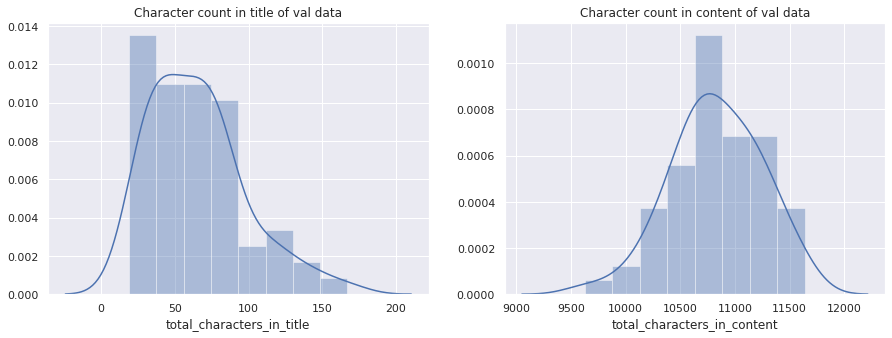

In [0]:
plot_histogram_chars(val_df, 'val')

- Val data articles are having character count in title around 10 to 70, where as in content in between 10.5k to 11.5k.

<h4>Box plots and Violin plots</h4>

In [0]:
def plot_box_and_violin_plots_chars(df, data='train'):
    '''Function to plot box-plots and violin-plots for character count'''
    fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(15,8))
    sns.violinplot(y ="total_characters_in_title", data=df, ax=axs[0][0]).set_title('Violin-plot for character count in title')
    sns.boxplot(y = "total_characters_in_title", data=df, ax=axs[0][1]).set_title('Box-plot for character count in title')
    sns.violinplot(y ="total_characters_in_content", data=df, ax=axs[1][0]).set_title('Violin-plot for character count in content')
    sns.boxplot(y = "total_characters_in_content", data=df, ax=axs[1][1]).set_title('Box-plot for character count in content')

<h4>Train data</h4>

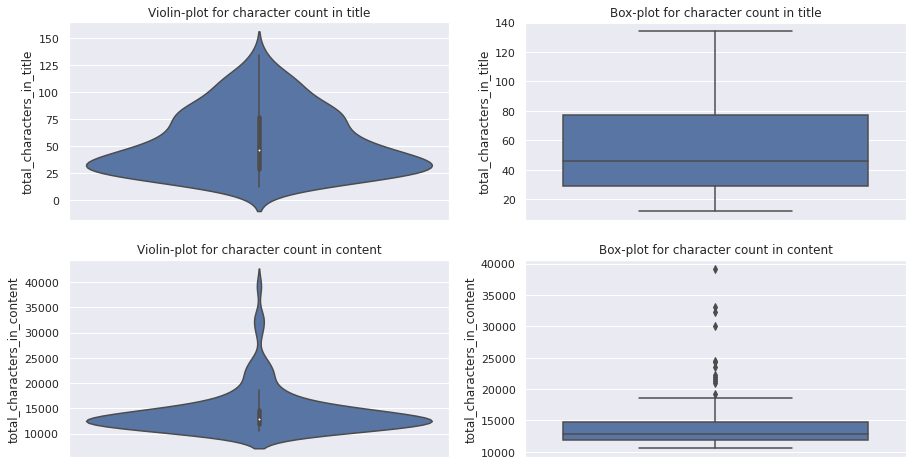

In [0]:
plot_box_and_violin_plots_chars(train_df, 'train')

<h4>Val data</h4>

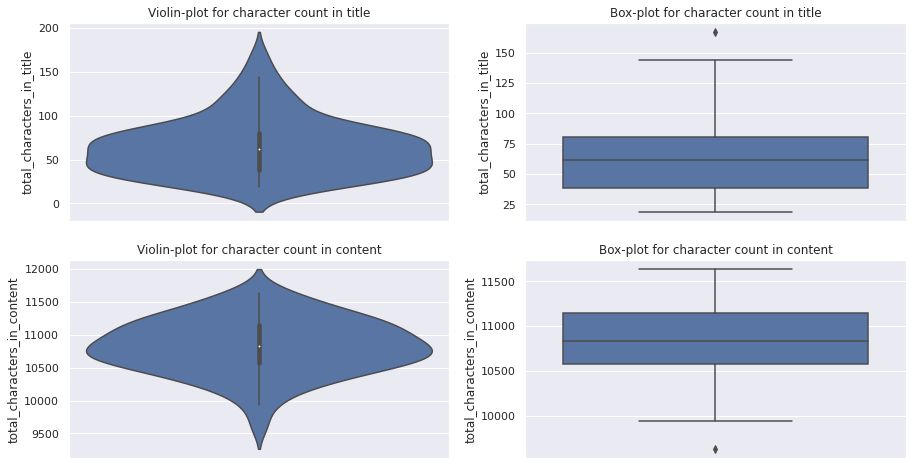

In [0]:
plot_box_and_violin_plots_chars(val_df, 'val')

- Most of the articles are having total character count for content between 500 to 10k charcters.
- Titles are having mostly 25 to 100 character count.

<h4>Histograms for words</h4>

In [0]:
def plot_histogram_words(df, data='train'):
    '''Function to plot histograms for words'''
    fig, axs = plt.subplots(ncols=2, figsize=(15,5))
    sns.distplot(df['total_words_in_content'], hist=True, kde=True, ax=axs[1])\
    .set_title('Total words in content of {} data'.format(data))
    sns.distplot(df['total_words_in_title'], hist=True, kde=True, ax=axs[0])\
    .set_title('Total words in title of {} data'.format(data))

<h4>Train data</h4>

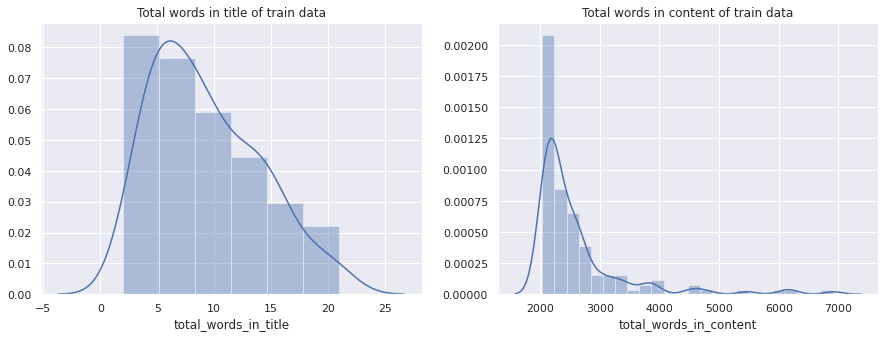

In [0]:
plot_histogram_words(train_df, 'train')

- Train articles are having word count in titles from 5 to 15 and in content it is around 2k.

<h4>Val data</h4>

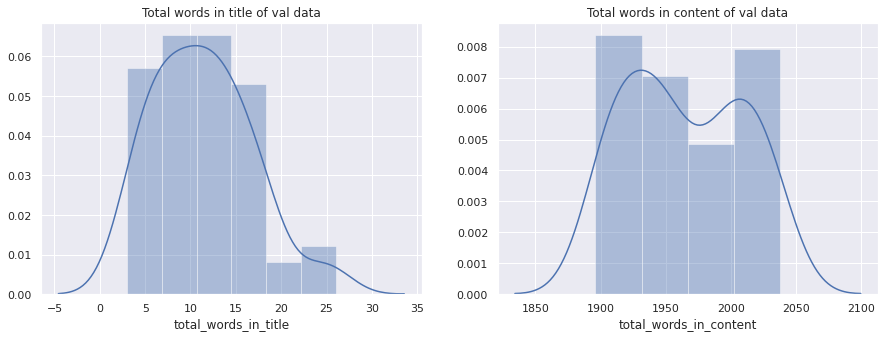

In [0]:
plot_histogram_words(val_df, 'val')

- Articles in val data are having wordcount in titles is between 5 to 15, and in content it is in between 1.9k to 2k.

<h4>Box plots and violin plots</h4>

In [0]:
def plot_box_and_violin_plots(df, data='train'):
    '''Function to plot box-plots and violin-plots for words'''
    fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(15,8))
    sns.violinplot(y ="total_words_in_title", data=df, ax=axs[0][0]).set_title('Violin-plot for total words in title')
    sns.boxplot(y = "total_words_in_title", data=df, ax=axs[0][1]).set_title('Box-plot for total words in title')
    sns.violinplot(y ="total_words_in_content", data=df, ax=axs[1][0]).set_title('Violin-plot for total words in content')
    sns.boxplot(y = "total_words_in_content", data=df, ax=axs[1][1]).set_title('Box-plot for total words in content')

<h4>Train data</h4>

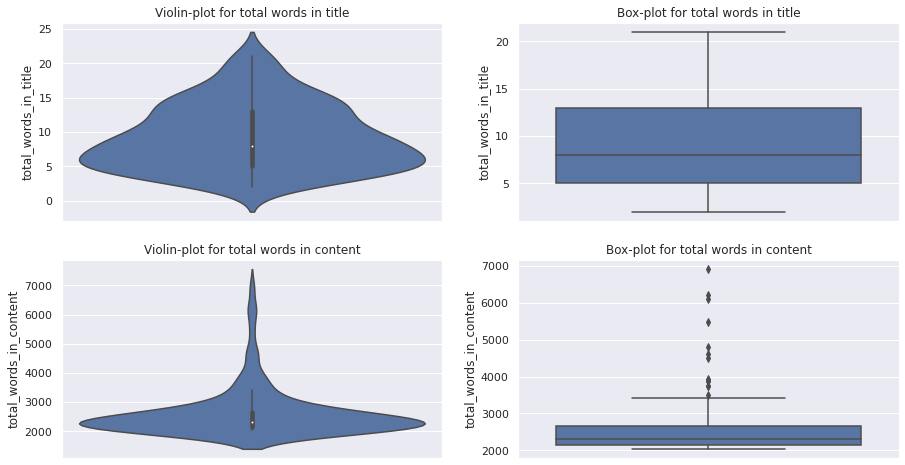

In [0]:
plot_box_and_violin_plots(train_df, data='train')

- From the above plots, it can be depicted that most of the titles of train data contains 8 to 15 words.
- Very few articles have extremely high word counts (>30cwords).
- Most of the articles contents written between 2000 to 2500 words.
- Few articles contains long contents (3000 to 7000 words)

<h4>Val data</h4>

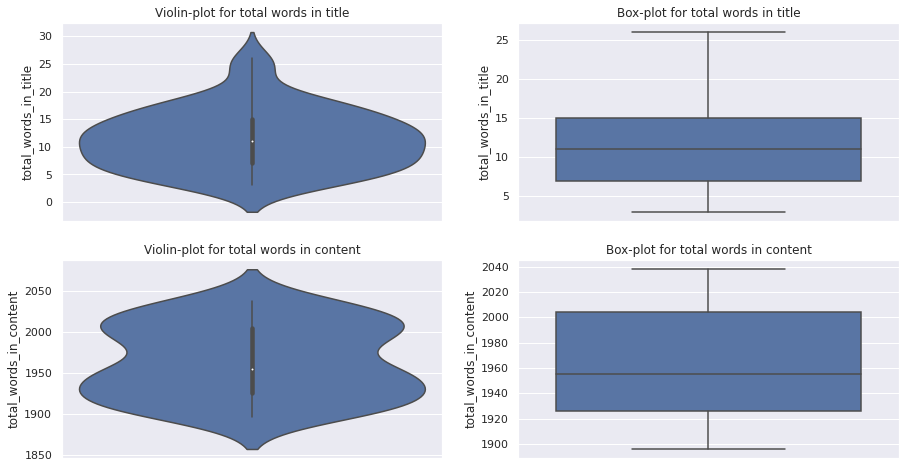

In [0]:
plot_box_and_violin_plots(val_df, data='val')

- For articles in CV data, most of them have medium length titles (5 to 15 words), where as few articles have long titles (> 20 words).
- In terms of content of the articles for val data, they are almost arround in length 1900 to 2050 words.

- Some articles are having weekly updates and discussion about episodes of space videos, which are having small word count. So the information from this kind of articles is almost similar like host name, episode name, etc. 
- Video content is not included in the articles, so apart from this at hand no diversity in content. So we will not consider those kind of articles.
- Some articles are having very small word count, which also we will not consider.

## 3. Data Preprocessing

We will use glove model of 840B words and 300 dim vectors to represent each word in the article.

In [0]:
# mapping of words to index number and vice versa

number_to_words = {id:word for id, word in enumerate(unique_sorted_words)}
words_to_number = {word:id for id, word in enumerate(unique_sorted_words)}

In [0]:
# saving dictionaries for further usage

with open('/content/drive/My Drive/Project-1(AAIC)/number_to_words', 'wb') as fp:
    pickle.dump(number_to_words, fp)
with open('/content/drive/My Drive/Project-1(AAIC)/words_to_number', 'wb') as fp1:
    pickle.dump(words_to_number, fp1)

In [0]:
with open('/content/drive/My Drive/CS-2/number_to_words', 'rb') as fp:
   number_to_words = pickle.load(fp)
with open('/content/drive/My Drive/CS-2/words_to_number', 'rb') as fp1:
    words_to_number = pickle.load(fp1)

In [0]:
with open('/content/drive/My Drive/Project-1(AAIC)/unique_sorted_words', 'wb') as fp:
  pickle.dump(unique_sorted_words, fp)

In [0]:
with open('/content/drive/My Drive/Project-1(AAIC)/glove_840B_300d', 'rb') as fp:
  glove_840B_300d = pickle.load(fp)

<h3>Convert each word with 300 dim glove vector</h3>

In [0]:
# load the whole embedding into memory
glove_840B_300d = dict()
f = open(r'/content/drive/My Drive/Project-1(AAIC)/glove.840B.300d.txt', encoding="utf8")
for line in f:
    values = line.split()
    word = ''.join(values[:-300])
    coefs = np.asarray(values[-300:], dtype='float32')
    glove_840B_300d[word] = coefs
f.close()
print('Loaded %s word vectors.' % len(glove_840B_300d))

Loaded 2195892 word vectors.


In [0]:
def generate_embedding_matrix():
  '''Function to generate embedding matrix for our train data'''
  embedding_matrix = np.zeros((vocab_size, 300))
  random.seed(42)
  present_count1 = 0
  absent_count1 = 0
  present_words1 = []
  absent_words1 = []
  for word in unique_sorted_words:
    if word in glove_840B_300d and glove_840B_300d[word] is not None:
      embedding_matrix[words_to_number[word]] = glove_840B_300d[word]
      present_words1.append(word)
      present_count1 = present_count1 + 1
    else:
      random_vector = np.random.uniform(-1,1,(300))
      embedding_matrix[words_to_number[word]] = random_vector
      absent_words1.append(word)
      absent_count1 = absent_count1 + 1
  return embedding_matrix, present_count1, absent_count1

embedding_matrix, present_count1, absent_count1 = generate_embedding_matrix()

print("Total words having 300 dim vectors are", present_count1, "persentage {:.4f}%".format((present_count1/vocab_size)*100))
print("Total words having 300 dim randomly generated vectors are",absent_count1, "persentage {:.4f}%".format((absent_count1/vocab_size)*100))
print('Total words are ', present_count1 + absent_count1)

Total words having 300 dim vectors are 14175 persentage 92.6289%
Total words having 300 dim randomly generated vectors are 1128 persentage 7.3711%
Total words are  15303


We have total 92.62% words in train data whose vectors are present in the glove model.

In [0]:
with open('/content/drive/My Drive/Project-1(AAIC)/embedding_matrix','wb') as fp:
  pickle.dump(embedding_matrix, fp)

In [0]:
with open('/content/drive/My Drive/CS-2/embedding_matrix', 'rb') as f:
  embedding_matrix = pickle.load(f)

In [7]:
embedding_matrix.shape

(15303, 300)

In [0]:
def convert_words_to_number(df, data='Content'):
    '''Function to convert all articles into numbers according to dictionaries'''
    num_data = []
    for e in tqdm(df[data].values):
        ele_data = []
        for word in e.split(' '):
            if word in words_to_number:
                ele_data.append(words_to_number[word])
            else:
                ele_data.append(0)
        num_data.append(ele_data)
    return num_data

train_data = convert_words_to_number(train_df, 'Content')
val_data = convert_words_to_number(val_df, 'Content')

100%|██████████| 64/64 [00:00<00:00, 2037.40it/s]


We will consider 2041 data length to pad, and we will truncate remaining words.

In [0]:
data_len = 2041
train_pad_data = tf.keras.preprocessing.sequence.pad_sequences(train_data, maxlen=data_len, padding='post', truncating='post',value=0.0)
val_pad_data = tf.keras.preprocessing.sequence.pad_sequences(val_data, maxlen=data_len, padding='post', truncating='post',value=0.0)

In [0]:
np.save('/content/drive/My Drive/Project-1(AAIC)/train_pad_data.npy', train_pad_data)
np.save('/content/drive/My Drive/Project-1(AAIC)/val_pad_data.npy', val_pad_data)

In [0]:
train_data_seq_pad = np.load('/content/drive/My Drive/Project-1(AAIC)/train_data_pad.npy')
cv_data_seq_pad = np.load('/content/drive/My Drive/Project-1(AAIC)/cv_data_pad.npy')

## 4. Data input pipeline

- We will build two models from scratch, LSTM and Attention model.
- Below functions are used to generate data in batches for the two models.

In [0]:
seq_len = 40
batch_size = 64
vocab_size = 15303

def attention_data_generator(data):
  '''Function to genrate batch data for attention model'''
  vertical_len = data.shape[0]
  horizontal_len = data.shape[1]
  steps = horizontal_len//seq_len - 1

  i = j = 0
  while i < vertical_len:
    x = np.zeros((batch_size, seq_len))
    y = np.zeros((batch_size, seq_len))
    z = np.zeros((batch_size, seq_len))
    for c in range(batch_size):
      x[c] = data[i][j:j+seq_len]
      y[c] = data[i][j+seq_len:j+(2*seq_len)]
      z[c] = data[i][j+seq_len+1:j+(2*seq_len)+1]
      i = i + 1
    if j != (horizontal_len - 1- (2 * seq_len)):
      i = i - batch_size
      j = j + seq_len
    else:
      j = 0
    yield x, y, z

def Batch_generator(data):
  '''Function to genrate batch data for LSTM model'''
  vertical_len = data.shape[0]
  horizontal_len = data.shape[1]
  
  i = j = 0
  while i < vertical_len:
    x = np.zeros((batch_size, seq_len))
    y = np.zeros((batch_size, seq_len))
    for c in range(batch_size):
      x[c] = data[i][j:j+seq_len]
      y[c] = data[i][j+1:j+seq_len+1]
      i = i + 1
    if j != (horizontal_len - 1- seq_len):
      i = i - batch_size
      j = j + seq_len
    else:
      j = 0
    yield x, y

x_tr_at = tf.data.Dataset.from_generator(lambda: attention_data_generator(data=train_pad_data),output_types= (tf.float64), output_shapes =(3, batch_size, seq_len))
x_val_at = tf.data.Dataset.from_generator(lambda: attention_data_generator(data=val_pad_data),output_types= (tf.float64), output_shapes =(3, batch_size, seq_len))

x_tr = tf.data.Dataset.from_generator(lambda: Batch_generator(data=train_pad_data),output_types= (tf.float64), output_shapes =(2, batch_size, seq_len))
x_val = tf.data.Dataset.from_generator(lambda: Batch_generator(data=val_pad_data),output_types= (tf.float64), output_shapes =(2, batch_size,seq_len))

## 5. Model Creation

### Model 1. LSTM model

- In this model we are using stateful LSTM layer to maintain the sequence information. We will also use it's states during prediction.

In [0]:
# Class to create LSTM-model 

lstm_units = 1024
embedding_dim = 300
vocab_size = 15303

class Stacked_LSTM(tf.keras.Model):
  def __init__(self, vocab_size, embedding_dim, lstm_units, batch_size, embedding_matrix):
    super(Stacked_LSTM, self).__init__()
    self.batch_size = batch_size
    self.lstm_units = lstm_units
    self.vocab_size = vocab_size
    self.embedding_matrix = embedding_matrix
    self.embedding_dim = embedding_dim
    self.embedding = Embedding(input_dim=vocab_size, output_dim=embedding_dim, mask_zero=False, 
                        embeddings_initializer=tf.keras.initializers.Constant(embedding_matrix), trainable=True,
                         name="Embedding_layer")
    
    self.lstm = LSTM(units=lstm_units, return_state=True, return_sequences=True, activation='tanh', recurrent_activation='sigmoid', use_bias=True, 
                 kernel_initializer=tf.keras.initializers.glorot_uniform(seed=78),
                 recurrent_initializer=tf.keras.initializers.orthogonal(seed=36),
                 bias_initializer=tf.keras.initializers.zeros(),
                  name="LSTM1")
    
    self.dense = Dense(self.vocab_size, activation=None)

  def call(self, x, states):
    x = self.embedding(x)
    outputs, state_h, state_c = self.lstm(x, initial_state=states)
    predictions = self.dense(outputs)
    return predictions, state_h, state_c

  def initialize_hidden_state(self):
    state_c = tf.zeros((self.batch_size, self.lstm_units))
    state_h = tf.zeros((self.batch_size, self.lstm_units))
    states = [state_h, state_c]
    return states

stacked_model = Stacked_LSTM(vocab_size, embedding_dim, lstm_units, batch_size, embedding_matrix)
states = stacked_model.initialize_hidden_state()

- We will use RMSProp optimizer fpr our data, as it gives better results compare to Adam and SGD.
- We will use sparse_categorical_cross_entropy loss function, with logits so we need not to use any activation at last layer of our model. We will use logits not probabilities. 

In [0]:
def optimizer():
  return tf.keras.optimizers.RMSprop(learning_rate=0.001)
  
def loss(labels, logits):
    loss_ = tf.keras.losses.sparse_categorical_crossentropy(labels, logits, from_logits=True) 
    return loss_

- For batch data, we pick first articles of batchsize and from each article we will take sequences of words in the horizontal direction, till we get the end sequences of articles.
- After these horizontal steps for batch sized articles, we will reset the states of our model.

In [0]:
horizontal_steps = (train_pad_data.shape[1] - 1)//seq_len
vertical_steps = train_pad_data.shape[0]//batch_size
total_steps_in_epoch = horizontal_steps * vertical_steps

- We will save our gradients and loss for tensorboard, as we will use eager execution for training.
- We will save our model in checkpoint directory so that wwe can use it during prediction.

In [0]:
train_log_dir = 'logs/single_layer/train'
val_log_dir = 'logs/single_layer/val'

train_summary_writer = tf.summary.create_file_writer(train_log_dir)
val_summary_writer = tf.summary.create_file_writer(val_log_dir)

In [0]:
checkpoint_dir = '/content/drive/My Drive/CS-2/LSTM_model/stacked_model/single_layer'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(optimizer=optimizer(), stacked_model=stacked_model)

#### Training using eager execution

In [0]:
tf.config.experimental_run_functions_eagerly(False)
@tf.function
def train_step(x, y, states):
  '''Function for Training step'''
  loss_ = 0
  with tf.GradientTape() as tape:

    outputs, h, c = stacked_model(x, states)
    loss_ += loss(y, outputs)
    states = [h, c]

  batch_loss = loss_ 
  variables = stacked_model.trainable_variables 
  gradients = tape.gradient(loss_, variables)
  optimizer().apply_gradients(zip(gradients, variables))

  return batch_loss, gradients, variables, states

@tf.function
def val_step(x, y, states):
  '''Function for validation step'''
  loss_ = 0
  with tf.GradientTape() as tape:
    outputs, h, c = stacked_model(x, states)
    loss_ += loss(y, outputs)
    states = [h, c]
  return loss_, states


In [0]:
# source: https://www.tensorflow.org/tensorboard/get_started
# source: https://udai.gitbook.io/practical-ml/nn/training-and-debugging-of-nn

def training_function(x_tr, x_val, EPOCHS):
  '''Function that train LSTM model with batch-wise data'''
  train_loss = tf.keras.metrics.Mean('train_loss', dtype=tf.float32)
  val_loss = tf.keras.metrics.Mean('val_loss', dtype=tf.float32)
  step = 0
  print('Training start..')

  for epoch in range(EPOCHS):
    counter = 0
    start = time.time()
    states = stacked_model.initialize_hidden_state()
    train_loss.reset_states()
    s = []

    for x, y in x_tr:
      step += 1
      counter += 1
      grad_step = total_steps_in_epoch * epoch + counter

      batch_loss, gradients, variables, states = train_step(x, y, states)
      s = states
      train_loss(batch_loss)

      # write gradients into histograms for tensorboard
      with train_summary_writer.as_default():
            for i in range(len(variables)):
              name = variables[i].name
              tf.summary.histogram(name, gradients[i], step=grad_step)

      # when horizontal steps are completed for each set of articles, we will reset the states again for new set of articles
      if (step % horizontal_steps) == 0:
          stacked_model.initialize_hidden_state()

    with train_summary_writer.as_default():
          tf.summary.scalar('loss', train_loss.result().numpy(), step=epoch)

    for x, y in x_val:
      batch_loss, s = val_step(x, y, s)
      val_loss(batch_loss)

    # write loss into sclar for tensorboard
    with val_summary_writer.as_default():
          tf.summary.scalar('loss', val_loss.result().numpy(), step=epoch)

    if (epoch + 1) % 10 == 0:
      checkpoint.save(file_prefix = checkpoint_prefix)
      print('saved..')

    print('Epoch : {} Total train_avg_loss : {:.4f}, Total val_avg_loss : {:.4f}'.format(epoch+1, train_loss.result(), val_loss.result()))
    print('Time taken for 1 epoch {:.2f} sec\n'.format(time.time() - start))
    print('-'*50)

<h3>Single layer LSTM with RMSProp (0.001)</h3>

In [0]:
training_function(x_tr, x_val, 10)

Training start..

If you intended to run this layer in float32, you can safely ignore this warning. If in doubt, this warning is likely only an issue if you are porting a TensorFlow 1.X model to TensorFlow 2.

To change all layers to have dtype float64 by default, call `tf.keras.backend.set_floatx('float64')`. To change just this layer, pass dtype='float64' to the layer constructor. If you are the author of this layer, you can disable autocasting by passing autocast=False to the base Layer constructor.

Epoch : 1 Total train_avg_loss : 6.2037, Total val_avg_loss : 5.6756
Time taken for 1 epoch 288.70 sec

--------------------------------------------------
Epoch : 2 Total train_avg_loss : 5.3440, Total val_avg_loss : 5.5305
Time taken for 1 epoch 293.21 sec

--------------------------------------------------
Epoch : 3 Total train_avg_loss : 4.9932, Total val_avg_loss : 5.4598
Time taken for 1 epoch 294.97 sec

--------------------------------------------------
Epoch : 4 Total train_avg_

In [0]:
training_function(x_tr, x_val, 10)

Training start..
Epoch : 1 Total train_avg_loss : 3.3031, Total val_avg_loss : 5.8667
Time taken for 1 epoch 274.64 sec

--------------------------------------------------
Epoch : 2 Total train_avg_loss : 3.2355, Total val_avg_loss : 5.8976
Time taken for 1 epoch 280.74 sec

--------------------------------------------------
Epoch : 3 Total train_avg_loss : 3.1914, Total val_avg_loss : 5.9315
Time taken for 1 epoch 281.30 sec

--------------------------------------------------
Epoch : 4 Total train_avg_loss : 3.1589, Total val_avg_loss : 5.9635
Time taken for 1 epoch 278.89 sec

--------------------------------------------------
Epoch : 5 Total train_avg_loss : 3.1434, Total val_avg_loss : 5.9930
Time taken for 1 epoch 277.16 sec

--------------------------------------------------
Epoch : 6 Total train_avg_loss : 3.1413, Total val_avg_loss : 6.0197
Time taken for 1 epoch 274.17 sec

--------------------------------------------------
Epoch : 7 Total train_avg_loss : 3.1509, Total val_av

#### Tensorboard

- Screenshots of Tensorboard for Loss, Distributions and histograms of gradients.

In [0]:
%load_ext tensorboard
%tensorboard --logdir ./logs/single_layer/

Reusing TensorBoard on port 6006 (pid 1367), started 0:47:32 ago. (Use '!kill 1367' to kill it.)

<IPython.core.display.Javascript object>

 Loss of train and val data :
 
 <img src="Tensorboard_screenshots/LSTM_loss.png">

- we can see that after certain itterations our model starts overfitting. As train_loss is decreasing but val_loss starts increasing.

 Histograms of gradients :
 
 <img src="Tensorboard_screenshots/LSTM_hist.png">

 Distributions of gradients :
 
 <img src="Tensorboard_screenshots/LSTM_disb.png">

- We can say that after certain steps our gradinets start vanishing due to long steps.

#### Prediction using LSTM model

- During inference stage, we will initialize our model with batch_size=1 and restore the trained weights from checkpoint.

In [15]:
stacked_model = Stacked_LSTM(vocab_size, embedding_dim, lstm_units, 1, embedding_matrix)
checkpoint.restore(tf.train.latest_checkpoint(checkpoint_dir))

- We will use two prediction approaches.
1. Probability: Here, we will take maximum probability from the given vocab_size probabilities.
2. Categorical Distribution: Here we will sample predictions from ranodm categorical distrbution.

In [0]:
# Source: https://www.tensorflow.org/tutorials/text/text_generation

def predicttion_fun_using_disb(seed, model, temperature, count):
  '''Prediction using categorical distribution.'''
  state_h = tf.zeros([1, lstm_units])
  state_c = tf.zeros([1, lstm_units])
  states = [state_h, state_c]
  final_list = [seed]
  temp = ''
  num_list = [words_to_number[word.lower()] for word in seed.split(' ')]
  
  for i in range(count):
    num_tensor = tf.expand_dims(num_list, 0)
    pred = stacked_model(num_tensor, states, training=False)
    states = [pred[1], pred[2]]
    pred = pred[0] / temperature
    sample_indices = tf.random.categorical(pred[0], num_samples=1)
    sample_indices = sample_indices[-1, 0].numpy()
    temp = temp + number_to_words[sample_indices] + ' '
    num_list = np.array(sample_indices).reshape(1)

  return temp

def prediction_func_using_prob(seed, model, count):
    '''Prediction using random categorical ditribution.'''
    state_h = tf.zeros([1, lstm_units])
    state_c = tf.zeros([1, lstm_units])
    states = [state_h, state_c]
    final_list = [seed]
    temp = ''
    num_list = [words_to_number[word.lower()] for word in seed.split(' ')]

    for i in range(count):
      num_tensor = tf.expand_dims(num_list, 0)
      pred = stacked_model(num_tensor, states, training=False)
      states = [pred[1], pred[2]]
      indices = np.argmax(pred[0], axis=-1)
      ind = indices[0][-1]
      temp = temp + number_to_words[ind] + ' '
      num_list = np.array(ind).reshape(1)

    return temp

In [0]:
def calculate_loss_metric(seed, stacked_model):

  '''Function to calculate loss and perplexity for LSTM model'''
  numbers = [words_to_number[word.lower()] for word in seed.split(' ')]
  x = numbers[:-1]
  y = numbers[1:]
  labels = np.array(y)
  state_h = tf.zeros([1, lstm_units])
  state_c = tf.zeros([1, lstm_units])
  states = [state_h, state_c]

  num_tensor = tf.expand_dims(x, 0)
  pred = stacked_model(num_tensor, states, training=False)
  pred = tf.squeeze(pred[0], 0)
  sample_indices = tf.random.categorical(pred, num_samples=1)
  logits = tf.squeeze(sample_indices, axis=1).numpy()

  loss_ = loss(labels, logits, from_logits=True)
  perplexity = tf.math.exp(loss_)

  return loss_, perplexity

#### Results

In [0]:
seed = 'In the history of spaceflight , only one nation'
temp = prediction_func_using_prob(seed, stacked_model, 20)

print(seed + ' ' + temp)

In the history of spaceflight , only one nation nancy lego elt clicks technique humbled grained cracked cracked cracked hood hood shortage shortage study walking spatially spatially shown mittelwerk 


In [22]:
seed = 'In the history of spaceflight , only one nation'
temperature = 1.0
temp = predicttion_fun_using_disb(seed, stacked_model, temperature, 20)

print(seed + ' ' + temp)

In the history of spaceflight , only one nation accord happy rubins attainable accelerates writing violating contract topography finder child walking concerns whitish barren equuleus generates undertakings parasites females 


In [0]:
seed = 'one of the more ambitious has been the creation'
temp = prediction_func_using_prob(seed, stacked_model, 10)

print(seed + ' ' + temp)

one of the more ambitious has been the creation audio intercepts intercepts hall victor phased stem stem ripples east 


In [0]:
seed = 'one of the more ambitious has been the creation'
temperature = 1.0
temp = predicttion_fun_using_disb(seed, stacked_model, temperature, 10)

print(seed + ' ' + temp)

one of the more ambitious has been the creation nail gotten sustainability attracting proudly homepage isat distinguish powder return 


In [0]:
seed = 'Next to actually sending another spacecraft there'
temp = prediction_func_using_prob(seed, stacked_model, 50)

print(seed + ' ' + temp)

Next to actually sending another spacecraft there audio skepticism studying order order sue author orbitpress regimes albina eyes analysis appendage analysis columba inflationary adequately eos design design spotting spotting spotting fundamental tray cis found vortex jewels medal medal medal medal canadian antimatter cooling cooling trained segundo dophins welders simba bernal petr organs mimics assemblies luvoir dropped exhalation 


In [23]:
seed = 'Next to actually sending another spacecraft there'
temperature = 0.5
temp = predicttion_fun_using_disb(seed, stacked_model, temperature, 50)

print(seed + ' ' + temp)

Next to actually sending another spacecraft there occasional noam famines scenic magnification mandated elliptic glow satellites scribbled permit tre warmer phases amateurs quotes meantime hooks loss lambda negatively appendages teams entailing terminate refrangibilities pella tarantula andrian selection ark dataset utterly mx enabled robot surya bands hangar sarah distinguishing etnos thunder jhuapl analogous interfering mathematicians tuesday writings uniting 


### Model 2. Attention based Encoder-Decoder Model

- We will use encoder decoder based attention model, in which we will use Bahdanau style attention between encoder and decoder.

<h3>Encoder</h3>

- Encoder will take input sequence of words and pass through LSTM layer via Embedding and return its outputs and hidden states.

In [0]:
# Class Encoder
# source : https://www.tensorflow.org/tutorials/text/nmt_with_attention
lstm_units = 128
class Encoder(tf.keras.Model):

  def __init__(self, vocab_size, embedding_dim, lstm_units, batch_size, embedding_matrix):
    super(Encoder, self).__init__()
    self.batch_size = batch_size
    self.lstm_units = lstm_units
    self.vocab_size = vocab_size
    self.embedding_matrix = embedding_matrix
    self.embedding_dim = embedding_dim
    self.lstm_units = lstm_units
    self.embedding = Embedding(input_dim=vocab_size, output_dim=embedding_dim, mask_zero=False, 
                        embeddings_initializer=tf.keras.initializers.Constant(embedding_matrix), trainable=False,
                         name="Encoder_Embedding_layer")
    self.lstm = LSTM(units=lstm_units, return_state=True, return_sequences=True, activation='tanh', recurrent_activation='sigmoid', use_bias=True, 
                 kernel_initializer=tf.keras.initializers.glorot_uniform(seed=6),
                 recurrent_initializer=tf.keras.initializers.orthogonal(seed=4),
                 bias_initializer=tf.keras.initializers.zeros(), name="LSTM_Eecoder")
    
  def call(self, x, hidden_states):
    x = self.embedding(x)
    encoder_outputs, encoder_state, _ = self.lstm(x, initial_state=hidden_states)
    return encoder_outputs, encoder_state

  def initialize_hidden_state(self):
    tf.random.set_seed(5)
    state_c = tf.zeros((self.batch_size, self.lstm_units))
    state_h = tf.zeros((self.batch_size, self.lstm_units))
    encoder_states = [state_h, state_c]
    return encoder_states

encoder = Encoder(vocab_size, embedding_dim, lstm_units, batch_size, embedding_matrix)

<h3>Attention layer</h3>

- Attention layer is used to generate score from encoder outputs and deocder states. Softmax will be applied on these scores to get weights values between 0 to 1. Weights are learned thorugh the network and multiplied with the encoder outputs.
- At the end, more weightage is given to the important encoder outputs.

In [0]:
#Attention Layer
class Attetion_layer(tf.keras.layers.Layer):

  def __init__(self, units):
    super(Attetion_layer, self).__init__()
    self.W1 = Dense(units)
    self.W2 = Dense(units)
    self.V = Dense(1)

  def call(self, decoder_states, encoder_outputs):
    decoder_states_with_time_axis = tf.expand_dims(decoder_states, axis=1)
    score = self.V(tf.nn.tanh(
                              self.W1(decoder_states_with_time_axis) + self.W2(encoder_outputs)
                              ))
    alpha = tf.nn.softmax(score, axis=1)
    context_vector = alpha * encoder_outputs
    context_vector = tf.reduce_sum(context_vector, axis=1)
    context_vector = tf.reshape(context_vector, [context_vector.shape[0],1,context_vector.shape[1]])

    return alpha, context_vector


<h3>Decoder</h3>

- Decoder is used to concate context vector with its inputs and generate outputs.

In [0]:
# Class Decoder
class Decoder(tf.keras.Model):
  def __init__(self, vocab_size, embedding_dim, lstm_units, batch_size, embedding_matrix):
    super(Decoder, self).__init__()
    self.batch_size = batch_size
    self.vocab_size = vocab_size
    self.embedding_dim = embedding_dim
    self.embedding_matrix = embedding_matrix
    self.lstm_units = lstm_units
    self.embedding = Embedding(input_dim=vocab_size, output_dim=embedding_dim, mask_zero=False, 
                        embeddings_initializer=tf.keras.initializers.Constant(embedding_matrix), trainable=False,
                         name="Decoder_Embedding_layer")
    self.lstm = LSTM(units=lstm_units, return_state=True, return_sequences=True, activation='tanh', recurrent_activation='sigmoid', use_bias=True, 
                 kernel_initializer=tf.keras.initializers.glorot_uniform(seed=26),
                 recurrent_initializer=tf.keras.initializers.orthogonal(seed=54),
                 bias_initializer=tf.keras.initializers.zeros(), name="LSTM_Decoder")
    self.dense = Dense(vocab_size, activation=None, name='Decoder_output')
    self.attention = Attetion_layer(lstm_units)
  
    
  def call(self, x, decoder_states, encoder_outputs):
    alpha, context_vector = self.attention(decoder_states, encoder_outputs)
    x = self.embedding(x)
    x = tf.concat([x, context_vector], axis=-1)
    decoder_outputs, state_h, _ = self.lstm(x)
    x = self.dense(decoder_outputs)

    return x, state_h, alpha

decoder = Decoder(vocab_size, embedding_dim, lstm_units, batch_size, embedding_matrix)

### Training using Eage execution

In [0]:
def optimizer():
  return tf.keras.optimizers.RMSprop(learning_rate=0.001)
def loss(labels, logits):
    return tf.keras.losses.sparse_categorical_crossentropy(labels, logits, from_logits=True) 

In [0]:
checkpoint_dir = '/content/drive/My Drive/Project-1(AAIC)/LSTM_model/Attention/'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(optimizer=optimizer(),
                                 encoder=encoder,
                                 decoder=decoder)

In [0]:
train_log_dir = 'logs/gradient_tape/attention/train'
val_log_dir = 'logs/gradient_tape/attention/val'
train_summary_writer = tf.summary.create_file_writer(train_log_dir)
val_summary_writer = tf.summary.create_file_writer(val_log_dir)

In [0]:
tf.config.experimental_run_functions_eagerly(False)
@tf.function
def train_step(encoder_input, decoder_input, decoder_labels, encoder_states):
  '''Function for train step'''
  loss_ = 0
  with tf.GradientTape() as tape:
    encoder_output, encoder_state_h= encoder(encoder_input, encoder_states)
    decoder_states = encoder_state_h

    for t in range(decoder_input.shape[1]):
      dec_input = tf.expand_dims(decoder_input[:,t], axis=1)
      dec_label = tf.expand_dims(decoder_labels[:,t], axis=1)
      predictions, decoder_state_h, _ = decoder(dec_input, decoder_states, encoder_output)
      predictions = tf.reshape(predictions, [batch_size, vocab_size])
      loss_ += loss(dec_label, predictions)

  batch_loss = (loss_ / int(decoder_input.shape[1]))
  variables = encoder.trainable_variables + decoder.trainable_variables
  gradients = tape.gradient(loss_, variables)
  optimizer().apply_gradients(zip(gradients, variables))
  return batch_loss, gradients, variables

def val_step(encoder_input, decoder_input, decoder_labels, encoder_states):
  '''Function for validation step'''
  loss_ = 0
  with tf.GradientTape() as tape:
    encoder_output, encoder_state_h = encoder(encoder_input, encoder_states)
    decoder_states = encoder_state_h

    for t in range(decoder_input.shape[1]):
      dec_input = tf.expand_dims(decoder_input[:,t], axis=1)
      dec_label = tf.expand_dims(decoder_labels[:,t], axis=1)
      predictions, decoder_state_h, _ = decoder(dec_input, decoder_states, encoder_output)
      predictions = tf.reshape(predictions, [batch_size, vocab_size])
      loss_ += loss(dec_label, predictions)
  batch_loss = (loss_ / int(decoder_input.shape[1]))
  return batch_loss

In [0]:
horizontal_steps = train_pad_data.shape[1]//seq_len
vertical_steps = train_pad_data.shape[0]//batch_size
total_steps = vertical_steps * horizontal_steps

In [0]:
def Attetntion_training(EPOCHS):
  '''Function to train attention model for batch-wise dataset'''
  train_loss = tf.keras.metrics.Mean('train_loss', dtype=tf.float32)
  val_loss = tf.keras.metrics.Mean('val_loss', dtype=tf.float32)
  step = 0
  print('Training start..')

  for epoch in range(EPOCHS):
    start = time.time()
    encoder_states = encoder.initialize_hidden_state()
    train_loss.reset_states()
    val_loss.reset_states()
    
    count = 0
    for batch_data in x_tr_at:
      encoder_input = batch_data[0]
      decoder_input = batch_data[1]
      decoder_labels = batch_data[2]
      step += 1
      count += 1
      grad_step = epoch*total_steps + count
      batch_loss, gradients, variables = train_step(encoder_input, decoder_input, decoder_labels, encoder_states)
      train_loss(batch_loss)
      with train_summary_writer.as_default():
            for i in range(len(variables)):
              name = variables[i].name
              tf.summary.histogram(name, gradients[i], step=grad_step)

    with train_summary_writer.as_default():
          tf.summary.scalar('loss', train_loss.result().numpy(), step=epoch)

    for batch_data in x_val_at:
      encoder_input = batch_data[0]
      decoder_input = batch_data[1]
      decoder_ouput = batch_data[2]
      batch_loss = val_step(encoder_input, decoder_input, decoder_ouput, encoder_states)
      val_loss(batch_loss)
    with val_summary_writer.as_default():
          tf.summary.scalar('loss', val_loss.result().numpy(), step=epoch)

    if (epoch + 1) % 10 == 0:
      checkpoint.save(file_prefix = checkpoint_prefix)

    print('Epoch : {} train_avg_loss : {:.4f} val_avg_loss : {:.4f}'.format(epoch+1, train_loss.result(), val_loss.result()))
    print('Time taken for 1 epoch {:.2f} sec\n'.format(time.time() - start))
    print('-'*50)

Attetntion_training(20)

Training start..
Epoch : 1 train_avg_loss : 5.4188 val_avg_loss : 5.7295
Time taken for 1 epoch 112.11 sec

--------------------------------------------------
Epoch : 2 train_avg_loss : 5.4056 val_avg_loss : 5.7262
Time taken for 1 epoch 111.55 sec

--------------------------------------------------
Epoch : 3 train_avg_loss : 5.3967 val_avg_loss : 5.7446
Time taken for 1 epoch 111.51 sec

--------------------------------------------------
Epoch : 4 train_avg_loss : 5.3975 val_avg_loss : 5.7493
Time taken for 1 epoch 111.65 sec

--------------------------------------------------
Epoch : 5 train_avg_loss : 5.3871 val_avg_loss : 5.7723
Time taken for 1 epoch 111.10 sec

--------------------------------------------------
Epoch : 6 train_avg_loss : 5.3737 val_avg_loss : 5.7689
Time taken for 1 epoch 111.31 sec

--------------------------------------------------
Epoch : 7 train_avg_loss : 5.3701 val_avg_loss : 5.7829
Time taken for 1 epoch 112.44 sec

----------------------------------------

#### Tensorboard

In [0]:
%tensorboard --logdir logs/gradient_tape/attention/


<IPython.core.display.Javascript object>

<h4>Encoder results</h4>

 Loss of Encoder-Decoder model :
 
 <img src="Tensorboard_screenshots/decoder_loss.png">

 Histograms for Encoder's gradients :
 
 <img src="Tensorboard_screenshots/encoder_hist.png">

 Distributions of Encoder's gradients :
 
 <img src="Tensorboard_screenshots/encoder_distb.png">

<h4>Decoder results</h4>

 Histograms of Decoder's gradients :
 
 <img src="Tensorboard_screenshots/decoder_hist_1.png">

 Histograms of Decoder's gradients :
 
 <img src="Tensorboard_screenshots/decoder_hist_2.png">

 Distributions of Decoder's gradients :
 
 <img src="Tensorboard_screenshots/decoder_disb_1.png">

 Distributions of Decoder's gradients :
 
 <img src="Tensorboard_screenshots/decoder_disb_2.png">

#### Prediction using attention model

In [0]:
encoder = Encoder(vocab_size, embedding_dim, lstm_units, 1, embedding_matrix)
decoder = Decoder(vocab_size, embedding_dim, lstm_units, 1, embedding_matrix)
checkpoint.restore(tf.train.latest_checkpoint(checkpoint_dir))

In [0]:
def predict_function_attention(seed, count, temperature):
  '''Function for prediction'''
  final_number_list = []
  num_list = [words_to_number[word.lower()] for word in seed.split(' ')]
  encoder_input = num_list[0:-1]
  decoder_input = num_list[-1]
  decoder_input = np.array(decoder_input).reshape(1,1)
  encoder_input = tf.expand_dims(encoder_input, 0)
  encoder_states = encoder.initialize_hidden_state()
  encoder_outputs, h = encoder(encoder_input, encoder_states)
  decoder_states = h

  for i in range(40):
    predictions, decoder_states, _ = decoder(decoder_input, decoder_states, encoder_outputs)
    predictions = predictions/temperature
    predictions = tf.squeeze(predictions, axis=1)
    predictions.shape
    sample_indices = tf.random.categorical(predictions, num_samples=1)
    sample_indices = tf.squeeze(sample_indices, axis=1).numpy()
    final_number_list.append(sample_indices)
    decoder_input = tf.expand_dims(sample_indices, axis=1)
  pred_list = [number_to_words[elem[0]] for elem in final_number_list]
  final_string = seed + ' ' +  ' '.join(pred_list)

  return final_string

In [0]:
seed = 'In the history of spaceflight , only one nation'
temperature = 1.0
final_string = predict_function_attention(seed, 20, temperature)

print(final_string)

In the history of spaceflight , only one nation infall deadly subsystems atkinson moderate himalayan lance abrahamic improve constructing scistarter streak insufficient viking east deistic earthguide shellfish especially repurposed megalodon pressures vac definition instantaneously komsomol zingers astrobee effect propane cancelled prematurely icesheetmike sandstones application volcanoes cephalopods misty send combes


## Model 3. Pretrained GPT-2

- We will do transfer learning using pretrained GPT-2 (small - 124M) Transformer.
- This model is then finetuned on our articles data. Instead of passing articles in some number of sequence we can directly pass combined articles together.

In [0]:
pip install tensorflow==1.15
gpt2.download_gpt2(model_name="124M")
gpt2.mount_gdrive()
file_name = "file.txt"
gpt2.copy_file_from_gdrive(file_name)

#### Finetune GPT-2

The next cell will start the actual finetuning of GPT-2. It creates a persistent TensorFlow session which stores the training config, then runs the training for the specified number of `steps`. (to have the finetuning run indefinitely, set `steps = -1`)

The model checkpoints will be saved in `/checkpoint/run1` by default. The checkpoints are saved every 500 steps (can be changed) and when the cell is stopped.

The training might time out after 4ish hours; make sure you end training and save the results so you don't lose them!

**IMPORTANT NOTE:** If you want to rerun this cell, **restart the VM first** (Runtime -> Restart Runtime). You will need to rerun imports but not recopy files.

Other optional-but-helpful parameters for `gpt2.finetune`:


*  **`restore_from`**: Set to `fresh` to start training from the base GPT-2, or set to `latest` to restart training from an existing checkpoint.
* **`sample_every`**: Number of steps to print example output
* **`print_every`**: Number of steps to print training progress.
* **`learning_rate`**:  Learning rate for the training. (default `1e-4`, can lower to `1e-5` if you have <1MB input data)
*  **`run_name`**: subfolder within `checkpoint` to save the model. This is useful if you want to work with multiple models (will also need to specify  `run_name` when loading the model)
* **`overwrite`**: Set to `True` if you want to continue finetuning an existing model (w/ `restore_from='latest'`) without creating duplicate copies. 

In [0]:
#source : https://minimaxir.com/2019/09/howto-gpt2/
sess = gpt2.start_tf_sess()
gpt2.finetune(sess, dataset=file_name, model_name='124M', steps=2000, restore_from='fresh', run_name='run1', print_every=10, sample_every=200, save_every=500)
gpt2.copy_checkpoint_to_gdrive(run_name='run1')

Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
Loading checkpoint models/124M/model.ckpt
INFO:tensorflow:Restoring parameters from models/124M/model.ckpt


  0%|          | 0/1 [00:00<?, ?it/s]

Loading dataset...


100%|██████████| 1/1 [00:18<00:00, 18.54s/it]


dataset has 4100987 tokens
Training...
[10 | 17.41] loss=3.10 avg=3.10
[20 | 29.67] loss=2.91 avg=3.00
[30 | 41.93] loss=3.04 avg=3.02
[40 | 54.20] loss=3.09 avg=3.04
[50 | 66.46] loss=2.98 avg=3.02
[60 | 78.72] loss=2.75 avg=2.98
[70 | 90.99] loss=2.94 avg=2.97
[80 | 103.27] loss=2.70 avg=2.94
[90 | 115.55] loss=2.77 avg=2.92
[100 | 127.82] loss=2.57 avg=2.88
[110 | 140.09] loss=2.97 avg=2.89
[120 | 152.37] loss=2.89 avg=2.89
[130 | 164.64] loss=3.07 avg=2.90
[140 | 176.92] loss=2.92 avg=2.91
[150 | 189.17] loss=2.81 avg=2.90
[160 | 201.44] loss=2.78 avg=2.89
[170 | 213.70] loss=2.90 avg=2.89
[180 | 225.96] loss=2.73 avg=2.88
[190 | 238.21] loss=2.85 avg=2.88
[200 | 250.47] loss=2.70 avg=2.87
======== SAMPLE 1 ========
 that was made by this method – and then later used for the measurement in this study. For each individual particle, there were two different types of particles – the heavier heavier ion, or B-particles (aka. NGCs) – that were found to have the highest concentrations.Fo

In [0]:
gpt2.copy_checkpoint_to_gdrive(run_name='run1')

### Load a Trained Model Checkpoint

Running the next cell will copy the `.rar` checkpoint file from your Google Drive into the Colaboratory VM.

In [0]:
gpt2.copy_checkpoint_from_gdrive(run_name='run1')
sess = gpt2.start_tf_sess()
gpt2.load_gpt2(sess, run_name='run1')

### Generate Text From The Trained Model


In [0]:
gpt2.generate(sess, run_name='run1')

“It’s a bittersweet day for us.” – Usra Giri, co-founder of Spaceflight Now.“It’s a bittersweet day for us,” said Usra Giri, co-founder of Spaceflight Now. “We’re trying to figure out how to get the kids to come up with some solutions to get them to stay.”   The kids are excited and excited about what the future of spaceflight will be, especially with the inevitable competition from NASA and SpaceX, and from other space agencies, like Russia. “They’re going to be looking at everything from space to space,” said a child who asked to remain anonymous. “They’re going to be looking at everything from space to space,” the child said. “They’ve got their own personal battles with space.”   Spaceflight Now has partnered with space-based technology company Rocket Lab to develop a solution that will allow kids to travel with a parent to a safe place in space. The solution, as noted, involves a handheld device that can be attached to the spacecraft or sent off-world to a safe place. That way the 

<h3>Some known words as input seeds</h3>

In [0]:
gpt2.generate(sess,
              length=50,
              temperature=0.5,
              prefix="In the history of spaceflight , only one nation",
              nsamples=5,
              batch_size=5
              )

In the history of spaceflight , only one nation has achieved the feat: the Soviet Union. But the Soviet Union did it. It was the first nation to launch a rocket from a launch pad. It was the first nation to launch a rocket from a launch pad. It was the first to launch
In the history of spaceflight , only one nation has managed to colonize another planet: the Soviet Union. The Soviets launched their first lunar lander in November of 1972, and by the time it landed, the Moon was still in lunar orbit. They also made several attempts to colonize the Moon
In the history of spaceflight , only one nation has held the title of sole superpower – the United States. The Soviet Union, who were the first nation to achieve space flight, was the only nation to achieve space flight. And although they were technically still in the process of achieving space flight, they
In the history of spaceflight , only one nation has been able to launch satellites into space. The Soviet Union, for example, was able

In [0]:
gpt2.generate(sess,
              length=50,
              temperature=0.5,
              prefix="Next to actually sending another spacecraft there",
              nsamples=5,
              batch_size=5
              )

Next to actually sending another spacecraft there, there’s the matter of propulsion. When you put a spacecraft in space, it’s basically a rocket. But when you put a spacecraft into orbit, it’s a nuclear rocket. And that’s not rocket
Next to actually sending another spacecraft there, it’s not even close.   “The spacecraft is already in orbit, but it’s not going to get there in the next few years,” said Curt Schilling, ESA Director of Science. “
Next to actually sending another spacecraft there, you have to be kidding me. It’s going to take a bunch of money. But it’s going to be a pretty cool idea. And maybe even a crewed mission. Maybe even a human mission.   �
Next to actually sending another spacecraft there, you’d need to get off Earth and back to Earth. And if you’re going to send a spacecraft to Mars, you have to land on Mars. And it’s not going to be a rocket. It�
Next to actually sending another spacecraft there, the first stage needs to be ready to go. The first stage is suppose

In [0]:
gpt2.generate(sess,
              length=50,
              temperature=0.7,
              prefix="ISRO has launched Chandrayaan II",
              nsamples=5,
              batch_size=5
              )

ISRO has launched Chandrayaan II at an altitude of only about 20 km (15 miles) at a time from the launch pad in Chandrayaan, India. The lander and its two-stage lander will be launched in the evening of March 18th at 13:03
ISRO has launched Chandrayaan II on September 18, 2019. This mission will launch from the Vastal Pad, the Space Launch Complex 41 (SLC-41) in Chandrayaan, India. The satellite was launched by the Indian Space Research Organization (ISRO) under
ISRO has launched Chandrayaan II as it reaches its second mission launch from Pad 39A at the end of this month.This comes just a week after the probe launched from its command module on April 18, and will launch on Pad 39A at the end of this month. And
ISRO has launched Chandrayaan II to its orbit earlier this month. Chandrayaan II is the third mission to orbit the Earth from home and the first space mission to orbit the Moon. The probe’s main goal is to study the Moon’s interior structure, analyze
ISRO has launched Chandrayaan

In [0]:
gpt2.generate(sess,
              length=50,
              temperature=0.7,
              prefix="What is the Universe? That is one immensely loaded question!",
              nsamples=5,
              batch_size=5
              )

What is the Universe? That is one immensely loaded question! And as the cosmos is getting smaller and smaller in size, the answer is that it is expanding! The answer can be summed up this way: the Universe is expanding and shrinking!  For the sake of their study, the team consulted data from the
What is the Universe? That is one immensely loaded question!  The Main Group of galaxies (mainly Messier and M31) are pretty cool. And the good news is that they are the only galaxies in the Universe to host binary pairings with other galaxies. In fact, the only other galaxies to
What is the Universe? That is one immensely loaded question! But one thing we do know is that we can go back to the beginning of time, and tell the story of the Big Bang.We have written many articles about the Big Bang for Universe Today. Here’s The Big Bang Theory, The
What is the Universe? That is one immensely loaded question! For this reason, the Search for Extra Planets (SOG) teams have been conducting extensive s

<h3>Giving some out of context words!</h3>

In [0]:
gpt2.generate(sess,
              length=50,
              temperature=0.7,
              prefix="Shah rukh khan has been offered a film",
              nsamples=5,
              batch_size=5
              )

Shah rukh khan has been offered a film called “Liftoff of Light“. In the film, a group of mission controllers (the crew members and the scientists) are shown how the probe will be launched en route to the Moon. The mission team is also shown how
Shah rukh khan has been offered a film about the events of the time, and the circumstances leading up to it. In it, the filmmaker asks the reader to “walk on the Moon.” It’s a happy-couple film, for sure, but it�
Shah rukh khan has been offered a film in the form of an interesting documentary film.  “Khan’s ‘film’ is about the issues facing the Asian people and the cause of human rights,” said Shah rukh, in reply to a
Shah rukh khan has been offered a film about the first lunar landing, called The Moon Under the Moon.  This year sees the first opportunity for Moon tourism in 2019, when the launch of the China Lunar Exploration Program (CLEP) is scheduled to happen. The Chinese Lunar Exploration Program (
Shah rukh khan has been offered a film t

## Final Functions

- We will define final two functions.
- First function will take raw input and generate the sentence according to selected parameters like model, temperature, count, model, etc.
- Second function will take raw input and generate its output along with its loss.

In [0]:
def function_1(seed, temperature, count, model_name):

  '''This function will take raw input, temperature, count and model_name as an arguments and return the generated sentense according to model selection'''
  if model_name == 'stacked_model':
    # restore stacked_model from checkpoint
    stacked_model = Stacked_LSTM(vocab_size, embedding_dim, lstm_units, 1, embedding_matrix)
    checkpoint.restore(tf.train.latest_checkpoint(checkpoint_dir))
    temp = predicttion_fun_using_disb(seed, stacked_model, temperature, count)
    print(seed + ' ' + temp)

  else:
    # restore GPT-2 model from checkpoint
    gpt2.copy_checkpoint_from_gdrive(run_name='run1')
    sess = gpt2.start_tf_sess()
    gpt2.load_gpt2(sess, run_name='run1')
    gpt2.generate(sess, length=50, temperature=temperature, prefix=seed, nsamples=5, batch_size=5)

In [0]:
def function_2(seed):
    '''This function will calculate loss and metric for given raw inputs'''
    stacked_model = Stacked_LSTM(vocab_size, embedding_dim, lstm_units, 1, embedding_matrix)
    checkpoint.restore(tf.train.latest_checkpoint(checkpoint_dir))
    loss, perplexity = calculate_loss_metric(seed, stacked_model)
    print('Loss: {:.4f} Perplexity : {:.4f}'.format(loss, perplexity))

## Summary


####  Data cleaning and Preprocessing 
- Data cleaning and preparing is one of the main aspect. If data is not properly cleaned or pre-processed then our model will not learn much and it will result in poor performance.
- We keep only (.,?!) punctuations just to generate meaningful sentences.
- We replace all the numbers with numtag and all alphanumeric words with alphanumeric tags to reduce our vocab size.
- We also remove all duplicate articles.
- We analyze total word counts in articles and decide suitable data length for padding in such a way that our Embedding layer has not need to handle extra padded zeros as data points.






#### Data input pipeline
- As we have articles which are in length of more than 1700 words. If we directly pass whole article then it won't fit into our RAM and raise RAM crash issue.
- To solve this issue we have used Dataset generator form tf.data, which will yeild batch set of data accordeing our Batch generator function.
- To maintain sequence of information for each and every article we have used horizontal-vertical approach for batch set.
- We have used stateful LSTM with return states to generate sentence in continuation with given seeds.



#### Loss function
- We have larger vocab size, so instead of using categorical_crossentropy as loss function, we have used sparse_categorical_crossentropy. 
- To use this loss function we need not to convert our labels in one-hot-encodings as it will save lot of computaion time and space.
- We also used from_logits, which will use outputs calculated by previous layer as it is instead of passing them in the probabilty functions like softmax.


#### Optimizer
- We have tried optimizers like Adam, RMSprop, SGD. RMSprop is more suitable for our dataset. It decreases loss way faster then Adam and SGD.
- We have choosen 0.001 learning rate.



#### Eager-execution
- We have use gradienttape for training, as it gives us more control on our training and we can easily debug our model.
- We have written loss and gradients for each and every step in our tensorboard for analysis.



#### Batch-size and Sequence
- It is advisable to choose numbers in power of two for batch size like 32, 64, 128, etc to get more compatable with our RAM size. So, we experiment with these numbers and choose 64 as batch-size.
- If our sequence length is large like 100, 200 at that time gradients are vanishing. 
- Lower sequence lengtgh like 10, 20, 30, will result in slower convergence.
- We experiment with above numbers and choose 40 for sequence length.




#### Models
- When we use LSTM model with different number of units like 32, 64, 100, 128, 512, etc for 1024 units we got better results.
- We tried with stateless and stateful LSTMs but in stateful LSTM our model learns better.
- For inference stage, we are using states returned by previous inputs to maintain the sequence information.
- This gives some meaningful and better sentences.
- We tried with argmax and categorical_distribution for getting results, as argmax is kind of greedy approach. In this case sometimes we got repetition of words. Whreas in categorical_distribution we are selecting random samples so each and every time we got our words changed. We have also used temperature, if it is low then our predictions are more related and if it is high then it may result in more surprising words.
- We also used Attention based models, to give more weightage to the surrounding words in infernce part.
- We also experiment with differnt number of LSTM untits in Encoder and Decoder and fix 128 units.
- It tooks more time to train compare to simple model.
- In above both models we got sentence generated in some patterns like words/nouns and verbs together, adjective together with nouns.
- We are not getting exact stories in continuation as our models are simpler and data set is also limited in size.
- We used pretrained GPT-2 ( generative pre-trained Transformer). We used its small model which has 124M parameters and trained over millions of scrapped pages from reddit.
- We have finetuned this model with our articles data, and it leanrs faster and way better compare to our simple two models.
- It generates sentence meaningful and in continuation.



#### Conclusion
- From our experiments with models and trainig, we can conclude that if we use pretrained GPT-2 model it gives cool results and generate best results. 